In [1]:
using Pkg

In [2]:
ENV["PYTHON"] = "/home/tung/anaconda3/envs/celldancer/bin/python3"

"/home/tung/anaconda3/envs/celldancer/bin/python3"

In [3]:
Pkg.build("PyCall")

    Building Conda ─→ `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/b19db3927f0db4151cb86d073689f2428e524576/build.log`
    Building PyCall → `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/9816a3826b0ebf49ab4926e2b18842ad8b5c8f04/build.log`


In [4]:
using JuloVelo
using Plots

In [5]:
adata = read_adata("data/JuloVelo_pre.h5ad")

AnnData object 2930 ✕ 2000

In [6]:
adata.uns["iroot"] = 1

1

In [7]:
normalize(adata)

AnnData object 2930 ✕ 2000

In [8]:
filter_and_gene_kinetics_predetermination(adata)

[ Info: 1630 genes are filtered due to low correlation between norm_u and norm_s
[ Info: See adata.var[!, "bad_correlation_genes"] for details
[ Info: 7 genes are filtered due to bad kinetics
[ Info: See adata.var[!, "bad_kinetics_genes"] for details
[ Info: 363 genes are used to infer velocity
[ Info: See adata.var[!, "train_genes"] for details


AnnData object 2930 ✕ 2000

In [9]:
reshape_data(adata)

[ Info: Data is reshaped to (2, 2930, 363)


AnnData object 2930 ✕ 2000

In [10]:
Kinetics = build_velocity_model(adata)

[ Info: Successfully initialize velocity model


Chain(
  SpatialDense(2 => 100, depth = 363, leakyrelu),  # 108_900 parameters
  SpatialDense(100 => 100, depth = 363, leakyrelu),  # 3_666_300 parameters
  SpatialDense(100 => 3, depth = 363, σ),  # 109_989 parameters
)                   # Total: 6 arrays, 3_885_189 parameters, 14.821 MiB.

In [11]:
density_sampling(adata);

[ Info: Sample 2400 cells


In [12]:
train(adata, Kinetics)

[ Info: Training on gpu
[ Info: Training with Adam Optimizer
[ Info: TensorBoard logging at "/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/dentategyrus/full/saves/"
[ Info: Start training


Epoch: 0  Train: (cos_loss = 58499.04f0, penalty = 1166.6837f0, AvgMeanCos = 0.9329f0)
Epoch: 1  Train: (cos_loss = 57692.1f0, penalty = 1166.6324f0, AvgMeanCos = 0.9338f0)
Epoch: 2  Train: (cos_loss = 57085.453f0, penalty = 1166.5824f0, AvgMeanCos = 0.9345f0)
Epoch: 3  Train: (cos_loss = 56570.008f0, penalty = 1166.5317f0, AvgMeanCos = 0.9351f0)
Epoch: 4  Train: (cos_loss = 56102.535f0, penalty = 1166.4802f0, AvgMeanCos = 0.9356f0)
Epoch: 5  Train: (cos_loss = 55689.19f0, penalty = 1166.4288f0, AvgMeanCos = 0.9361f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 6  Train: (cos_loss = 55275.777f0, penalty = 1166.3774f0, AvgMeanCos = 0.9366f0)
Epoch: 7  Train: (cos_loss = 54865.023f0, penalty = 1166.3259f0, AvgMeanCos = 0.937f0)
Epoch: 8  Train: (cos_loss = 54461.402f0, penalty = 1166.2747f0, AvgMeanCos = 0.9375f0)
Epoch: 9  Train: (cos_loss = 54063.87f0, penalty = 1166.2233f0, AvgMeanCos = 0.9379f0)
Epoch: 10  Train: (cos_loss = 53691.18f0, penalty = 1166.172f0, AvgMeanCos = 0.9384f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 11  Train: (cos_loss = 53342.125f0, penalty = 1166.1205f0, AvgMeanCos = 0.9388f0)
Epoch: 12  Train: (cos_loss = 53026.832f0, penalty = 1166.0691f0, AvgMeanCos = 0.9391f0)
Epoch: 13  Train: (cos_loss = 52729.35f0, penalty = 1166.0172f0, AvgMeanCos = 0.9395f0)
Epoch: 14  Train: (cos_loss = 52460.473f0, penalty = 1165.9651f0, AvgMeanCos = 0.9398f0)
Epoch: 15  Train: (cos_loss = 52212.83f0, penalty = 1165.912f0, AvgMeanCos = 0.9401f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 16  Train: (cos_loss = 51985.72f0, penalty = 1165.8579f0, AvgMeanCos = 0.9403f0)
Epoch: 17  Train: (cos_loss = 51770.168f0, penalty = 1165.8031f0, AvgMeanCos = 0.9406f0)
Epoch: 18  Train: (cos_loss = 51577.977f0, penalty = 1165.7472f0, AvgMeanCos = 0.9408f0)
Epoch: 19  Train: (cos_loss = 51392.43f0, penalty = 1165.6906f0, AvgMeanCos = 0.941f0)
Epoch: 20  Train: (cos_loss = 51214.773f0, penalty = 1165.6332f0, AvgMeanCos = 0.9412f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 21  Train: (cos_loss = 51042.96f0, penalty = 1165.5747f0, AvgMeanCos = 0.9414f0)
Epoch: 22  Train: (cos_loss = 50872.984f0, penalty = 1165.5161f0, AvgMeanCos = 0.9416f0)
Epoch: 23  Train: (cos_loss = 50700.53f0, penalty = 1165.4564f0, AvgMeanCos = 0.9418f0)
Epoch: 24  Train: (cos_loss = 50531.133f0, penalty = 1165.3966f0, AvgMeanCos = 0.942f0)
Epoch: 25  Train: (cos_loss = 50359.15f0, penalty = 1165.336f0, AvgMeanCos = 0.9422f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 26  Train: (cos_loss = 50201.76f0, penalty = 1165.2754f0, AvgMeanCos = 0.9424f0)
Epoch: 27  Train: (cos_loss = 50056.605f0, penalty = 1165.2146f0, AvgMeanCos = 0.9425f0)
Epoch: 28  Train: (cos_loss = 49921.5f0, penalty = 1165.1533f0, AvgMeanCos = 0.9427f0)
Epoch: 29  Train: (cos_loss = 49786.234f0, penalty = 1165.0916f0, AvgMeanCos = 0.9429f0)
Epoch: 30  Train: (cos_loss = 49656.21f0, penalty = 1165.0294f0, AvgMeanCos = 0.943f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 31  Train: (cos_loss = 49544.105f0, penalty = 1164.9672f0, AvgMeanCos = 0.9431f0)
Epoch: 32  Train: (cos_loss = 49421.17f0, penalty = 1164.9044f0, AvgMeanCos = 0.9433f0)
Epoch: 33  Train: (cos_loss = 49312.375f0, penalty = 1164.8416f0, AvgMeanCos = 0.9434f0)
Epoch: 34  Train: (cos_loss = 49208.117f0, penalty = 1164.7782f0, AvgMeanCos = 0.9435f0)
Epoch: 35  Train: (cos_loss = 49110.312f0, penalty = 1164.7147f0, AvgMeanCos = 0.9436f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 36  Train: (cos_loss = 49023.15f0, penalty = 1164.6515f0, AvgMeanCos = 0.9437f0)
Epoch: 37  Train: (cos_loss = 48938.38f0, penalty = 1164.5878f0, AvgMeanCos = 0.9438f0)
Epoch: 38  Train: (cos_loss = 48851.19f0, penalty = 1164.5237f0, AvgMeanCos = 0.9439f0)
Epoch: 39  Train: (cos_loss = 48764.47f0, penalty = 1164.4596f0, AvgMeanCos = 0.944f0)
Epoch: 40  Train: (cos_loss = 48678.94f0, penalty = 1164.3953f0, AvgMeanCos = 0.9441f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 41  Train: (cos_loss = 48596.414f0, penalty = 1164.331f0, AvgMeanCos = 0.9442f0)
Epoch: 42  Train: (cos_loss = 48515.125f0, penalty = 1164.2668f0, AvgMeanCos = 0.9443f0)
Epoch: 43  Train: (cos_loss = 48437.438f0, penalty = 1164.2025f0, AvgMeanCos = 0.9444f0)
Epoch: 44  Train: (cos_loss = 48362.76f0, penalty = 1164.1377f0, AvgMeanCos = 0.9445f0)
Epoch: 45  Train: (cos_loss = 48291.016f0, penalty = 1164.0725f0, AvgMeanCos = 0.9446f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 46  Train: (cos_loss = 48224.793f0, penalty = 1164.0074f0, AvgMeanCos = 0.9446f0)
Epoch: 47  Train: (cos_loss = 48161.387f0, penalty = 1163.9418f0, AvgMeanCos = 0.9447f0)
Epoch: 48  Train: (cos_loss = 48090.516f0, penalty = 1163.8763f0, AvgMeanCos = 0.9448f0)
Epoch: 49  Train: (cos_loss = 48037.773f0, penalty = 1163.8107f0, AvgMeanCos = 0.9449f0)
Epoch: 50  Train: (cos_loss = 47974.387f0, penalty = 1163.7452f0, AvgMeanCos = 0.9449f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 51  Train: (cos_loss = 47906.527f0, penalty = 1163.6794f0, AvgMeanCos = 0.945f0)
Epoch: 52  Train: (cos_loss = 47854.312f0, penalty = 1163.6134f0, AvgMeanCos = 0.9451f0)
Epoch: 53  Train: (cos_loss = 47787.234f0, penalty = 1163.5469f0, AvgMeanCos = 0.9451f0)
Epoch: 54  Train: (cos_loss = 47740.797f0, penalty = 1163.4802f0, AvgMeanCos = 0.9452f0)
Epoch: 55  Train: (cos_loss = 47685.156f0, penalty = 1163.4133f0, AvgMeanCos = 0.9453f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 56  Train: (cos_loss = 47626.9f0, penalty = 1163.3462f0, AvgMeanCos = 0.9453f0)
Epoch: 57  Train: (cos_loss = 47572.203f0, penalty = 1163.2792f0, AvgMeanCos = 0.9454f0)
Epoch: 58  Train: (cos_loss = 47521.49f0, penalty = 1163.2119f0, AvgMeanCos = 0.9455f0)
Epoch: 59  Train: (cos_loss = 47474.926f0, penalty = 1163.1444f0, AvgMeanCos = 0.9455f0)
Epoch: 60  Train: (cos_loss = 47428.684f0, penalty = 1163.077f0, AvgMeanCos = 0.9456f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 61  Train: (cos_loss = 47376.742f0, penalty = 1163.0094f0, AvgMeanCos = 0.9456f0)
Epoch: 62  Train: (cos_loss = 47326.8f0, penalty = 1162.942f0, AvgMeanCos = 0.9457f0)
Epoch: 63  Train: (cos_loss = 47274.844f0, penalty = 1162.8745f0, AvgMeanCos = 0.9457f0)
Epoch: 64  Train: (cos_loss = 47222.86f0, penalty = 1162.807f0, AvgMeanCos = 0.9458f0)
Epoch: 65  Train: (cos_loss = 47170.066f0, penalty = 1162.7396f0, AvgMeanCos = 0.9459f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 66  Train: (cos_loss = 47118.477f0, penalty = 1162.6725f0, AvgMeanCos = 0.9459f0)
Epoch: 67  Train: (cos_loss = 47069.746f0, penalty = 1162.6049f0, AvgMeanCos = 0.946f0)
Epoch: 68  Train: (cos_loss = 47022.953f0, penalty = 1162.537f0, AvgMeanCos = 0.946f0)
Epoch: 69  Train: (cos_loss = 46977.395f0, penalty = 1162.4688f0, AvgMeanCos = 0.9461f0)
Epoch: 70  Train: (cos_loss = 46936.246f0, penalty = 1162.4005f0, AvgMeanCos = 0.9461f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 71  Train: (cos_loss = 46893.48f0, penalty = 1162.3322f0, AvgMeanCos = 0.9462f0)
Epoch: 72  Train: (cos_loss = 46850.516f0, penalty = 1162.2637f0, AvgMeanCos = 0.9462f0)
Epoch: 73  Train: (cos_loss = 46805.23f0, penalty = 1162.1952f0, AvgMeanCos = 0.9463f0)
Epoch: 74  Train: (cos_loss = 46758.72f0, penalty = 1162.1266f0, AvgMeanCos = 0.9463f0)
Epoch: 75  Train: (cos_loss = 46716.617f0, penalty = 1162.0582f0, AvgMeanCos = 0.9464f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 76  Train: (cos_loss = 46674.945f0, penalty = 1161.9893f0, AvgMeanCos = 0.9464f0)
Epoch: 77  Train: (cos_loss = 46634.156f0, penalty = 1161.9202f0, AvgMeanCos = 0.9465f0)
Epoch: 78  Train: (cos_loss = 46593.418f0, penalty = 1161.8512f0, AvgMeanCos = 0.9465f0)
Epoch: 79  Train: (cos_loss = 46551.496f0, penalty = 1161.7822f0, AvgMeanCos = 0.9466f0)
Epoch: 80  Train: (cos_loss = 46510.465f0, penalty = 1161.7129f0, AvgMeanCos = 0.9466f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 81  Train: (cos_loss = 46464.688f0, penalty = 1161.6438f0, AvgMeanCos = 0.9467f0)
Epoch: 82  Train: (cos_loss = 46418.203f0, penalty = 1161.5746f0, AvgMeanCos = 0.9467f0)
Epoch: 83  Train: (cos_loss = 46369.844f0, penalty = 1161.5051f0, AvgMeanCos = 0.9468f0)
Epoch: 84  Train: (cos_loss = 46326.797f0, penalty = 1161.4358f0, AvgMeanCos = 0.9468f0)
Epoch: 85  Train: (cos_loss = 46285.473f0, penalty = 1161.3665f0, AvgMeanCos = 0.9469f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 86  Train: (cos_loss = 46241.15f0, penalty = 1161.2966f0, AvgMeanCos = 0.9469f0)
Epoch: 87  Train: (cos_loss = 46201.844f0, penalty = 1161.227f0, AvgMeanCos = 0.947f0)
Epoch: 88  Train: (cos_loss = 46163.516f0, penalty = 1161.1572f0, AvgMeanCos = 0.947f0)
Epoch: 89  Train: (cos_loss = 46124.86f0, penalty = 1161.0874f0, AvgMeanCos = 0.9471f0)
Epoch: 90  Train: (cos_loss = 46075.867f0, penalty = 1161.0177f0, AvgMeanCos = 0.9471f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 91  Train: (cos_loss = 46030.355f0, penalty = 1160.9476f0, AvgMeanCos = 0.9472f0)
Epoch: 92  Train: (cos_loss = 45988.695f0, penalty = 1160.8777f0, AvgMeanCos = 0.9472f0)
Epoch: 93  Train: (cos_loss = 45944.72f0, penalty = 1160.8079f0, AvgMeanCos = 0.9473f0)
Epoch: 94  Train: (cos_loss = 45905.305f0, penalty = 1160.7377f0, AvgMeanCos = 0.9473f0)
Epoch: 95  Train: (cos_loss = 45865.562f0, penalty = 1160.6674f0, AvgMeanCos = 0.9474f0)


[ Info: Model is saved in saves/Kinetics.bson


Epoch: 96  Train: (cos_loss = 45820.64f0, penalty = 1160.597f0, AvgMeanCos = 0.9474f0)
Epoch: 97  Train: (cos_loss = 45776.6f0, penalty = 1160.5269f0, AvgMeanCos = 0.9475f0)
Epoch: 98  Train: (cos_loss = 45729.68f0, penalty = 1160.4564f0, AvgMeanCos = 0.9475f0)
Epoch: 99  Train: (cos_loss = 45685.43f0, penalty = 1160.3861f0, AvgMeanCos = 0.9476f0)
Epoch: 100  Train: (cos_loss = 45639.754f0, penalty = 1160.3156f0, AvgMeanCos = 0.9476f0)


[ Info: Model is saved in saves/Kinetics.bson


Chain(
  SpatialDense(2 => 100, depth = 363, leakyrelu),  # 108_900 parameters
  SpatialDense(100 => 100, depth = 363, leakyrelu),  # 3_666_300 parameters
  SpatialDense(100 => 3, depth = 363, σ),  # 109_989 parameters
)                   # Total: 6 arrays, 3_885_189 parameters, 14.821 MiB.

In [13]:
velocity_estimation(adata, Kinetics);

[ Info: Velocity saved in adata.uns["velocity"]
[ Info: kinetics saved in adata.uns["kinetics"]


In [14]:
compute_cell_velocity(adata; n_neighbors = 100);

In [15]:
write_adata(adata, filename = "data/JuloVelo")

# Plot figure

## Gene kinetics

In [16]:
palattes = Dict(
    "Astrocytes"=>"#3ba458",
    "Cajal Retzius"=>"#404040",
    "Cck-Tox"=>"#7a7a7a",
    "Endothelial"=>"#fda762",
    "GABA"=>"#6950a3",
    "Granule immature"=>"#2575b7",
    "Granule mature"=>"#08306b",
    "Microglia"=>"#e1bfb0",
    "Mossy"=>"#e5d8bd",
    "Neuroblast"=>"#79b5d9",
    "OL"=>"#f14432",
    "OPC"=>"#fc8a6a",
    "Radial Glia-like"=>"#98d594",
    "nIPC"=>"#d0e1f2"
)

Dict{String, String} with 14 entries:
  "Astrocytes"       => "#3ba458"
  "Granule immature" => "#2575b7"
  "OL"               => "#f14432"
  "GABA"             => "#6950a3"
  "Endothelial"      => "#fda762"
  "Mossy"            => "#e5d8bd"
  "Cajal Retzius"    => "#404040"
  "Microglia"        => "#e1bfb0"
  "Cck-Tox"          => "#7a7a7a"
  "Granule mature"   => "#08306b"
  "nIPC"             => "#d0e1f2"
  "Neuroblast"       => "#79b5d9"
  "Radial Glia-like" => "#98d594"
  "OPC"              => "#fc8a6a"

In [17]:
function gene_plot(x, x̂; part = 20)
    x_range = Array(range(0, 1, part))
    y_range = Array(range(0, 1, part))
    
    arrow_vector = Array{Float32}(undef, 0, 2)
    point_vector = Array{Float32}(undef, 0, 2)
    
    for i in 1:part - 1
        for j in 1:part - 1
            index = intersect(findall(k -> (k .>= x_range[i]) & (k .<= x_range[i + 1]), x[2, :]), 
            findall(k -> (k .>= y_range[j]) & (k .<= y_range[j + 1]), x[1, :]))
            
            if length(index) > 0
                selected = x̂[:, index]
            else
                continue
            end
            
            selected_vector = sum(selected, dims = 2) ./ size(selected, 2)
            scale = maximum(abs, selected_vector) / (x_range[i + 1] - x_range[i])
            selected_vector = selected_vector ./ scale
            #println(selected_vector)
            xcenter = (x_range[i + 1] + x_range[i]) / 2
            ycenter = (y_range[j + 1] + y_range[j]) / 2
            xarrow = selected_vector[2]
            yarrow = selected_vector[1]
            
            arrow_vector = vcat(arrow_vector, vec([xarrow, yarrow])')
            point_vector = vcat(point_vector, vec([xcenter, ycenter])')
        end
    end
    
    return arrow_vector, point_vector
end

gene_plot (generic function with 1 method)

In [18]:
theme(:vibrant, framestyle = :zerolines, grid = true, markersize = 3, linewidth = 1.4, palette = :tab20) 

In [19]:
GR.setarrowsize(0.5)

In [20]:
X = adata.uns["X"];
velocity = adata.uns["velocity"]
genes = adata.var_names[adata.var[!, "train_genes"]]
celltype = adata.obs[!, "clusters"]
labels = sort(unique(celltype));

In [21]:
idx = findfirst(x -> x == "Tmeff2", genes)

4

In [22]:
arrow_vector, point_vector = gene_plot(X[:, :, idx], velocity[:, :, idx])

([-0.0033682937028849972 0.05263157894736842; 0.01279470253764406 0.05263157894736842; … ; -0.0017771810624308748 -0.052631578947368474; -0.00017621036970068567 -0.052631578947368474], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9736842105263157 0.9210526315789473; 0.9736842105263157 0.9736842105263157])

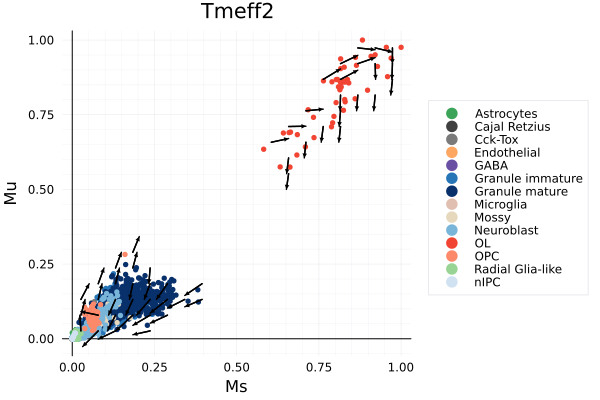

In [23]:
p1 = plot(legend = :outerright)
for label in labels
    scatter!(X[2, celltype .== label, idx], X[1, celltype .== label, idx], label = label, color = palattes[label], xlabel = "Ms", ylabel = "Mu", title = genes[idx])
end
quiver!(point_vector[:, 1], point_vector[:, 2], quiver = (arrow_vector[:, 1], arrow_vector[:, 2]), arrow = arrow(:closed), color = "#000000")

In [24]:
idx2 = findfirst(x -> x == "Jph1", genes)

14

In [25]:
arrow_vector1, point_vector1 = gene_plot(X[:, :, idx2], velocity[:, :, idx2])

([0.004508616206955653 0.05263157894736842; 0.02816810041947224 0.05263157894736842; … ; -0.052631578947368474 -0.047408890672239426; -0.052631578947368474 -0.03750991226362786], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.868421052631579 0.39473684210526316; 0.9736842105263157 0.39473684210526316])

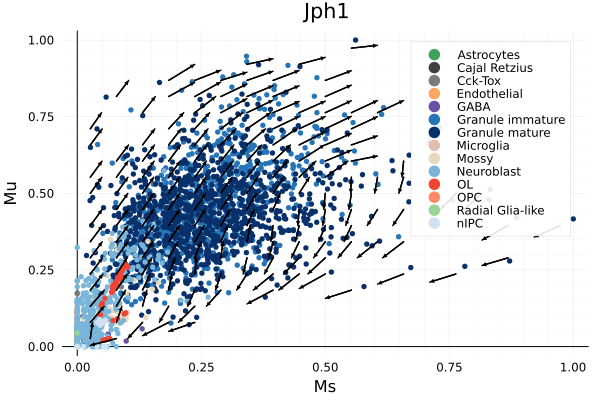

In [26]:
p2 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx2], X[1, celltype .== label, idx2], label = label, color = palattes[label], xlabel = "Ms", ylabel = "Mu", title = genes[idx2])
end
quiver!(point_vector1[:, 1], point_vector1[:, 2], quiver = (arrow_vector1[:, 1], arrow_vector1[:, 2]), arrow = arrow(:closed), color = "#000000")

In [27]:
idx3 = findfirst(x -> x == "Col19a1", genes)

16

In [28]:
arrow_vector2, point_vector2 = gene_plot(X[:, :, idx3], velocity[:, :, idx3])

([-0.014248566678690991 0.05263157894736842; 0.014420997368923036 0.05263157894736842; … ; -0.048717588551885765 -0.05263157894736836; -0.052631578947368474 -0.052445675702181595], [0.02631578947368421 0.02631578947368421; 0.02631578947368421 0.07894736842105263; … ; 0.9210526315789473 0.5; 0.9736842105263157 0.5])

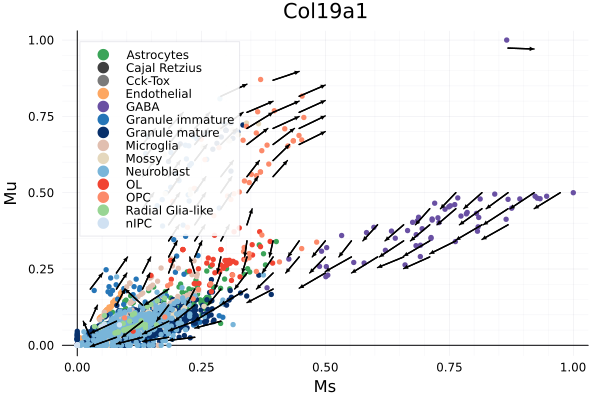

In [29]:
p3 = plot()
for label in labels
    scatter!(X[2, celltype .== label, idx3], X[1, celltype .== label, idx3], label = label, color = palattes[label], xlabel = "Ms", ylabel = "Mu", title = genes[idx3])
end
quiver!(point_vector2[:, 1], point_vector2[:, 2], quiver = (arrow_vector2[:, 1], arrow_vector2[:, 2]), arrow = arrow(:closed), color = "#000000")

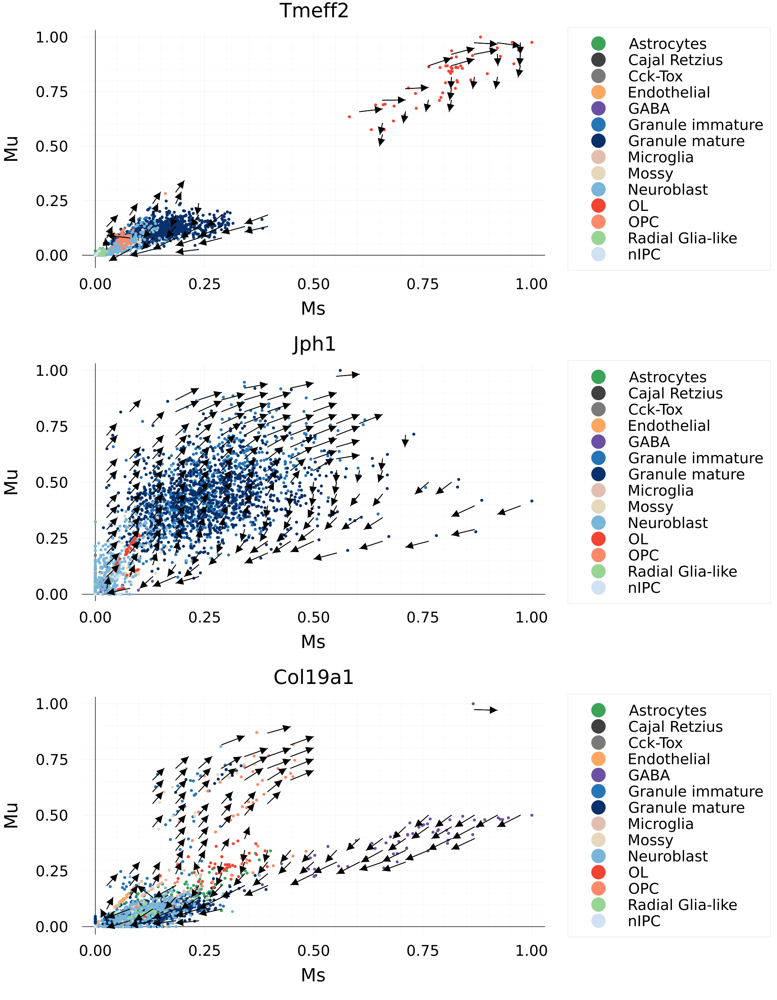

In [30]:
p = plot(p1, p2, p3, layout = (3, 1), size = (1400, 1800), dpi = 150, left_margins = 1.0Plots.cm, bottom_margins = 0.5Plots.cm, legendfontsize = 18, 
    legend = :outerright, xtickfontsize = 18, ytickfontsize = 18, xguidefontsize = 22, yguidefontsize = 22, titlefontsize = 24)

In [31]:
savefig(p, "figure/JuloVelo_velocity_vector.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/dentategyrus/full/figure/JuloVelo_velocity_vector.png"

## Kinetic embedding

In [32]:
kinetics_embedding(adata; basis = "umap");

In [33]:
embedding = adata.obsm["kinetics_umap"];

In [34]:
celltype = adata.obs[!, "clusters"]
labels = sort(unique(celltype))

14-element Vector{String}:
 "Astrocytes"
 "Cajal Retzius"
 "Cck-Tox"
 "Endothelial"
 "GABA"
 "Granule immature"
 "Granule mature"
 "Microglia"
 "Mossy"
 "Neuroblast"
 "OL"
 "OPC"
 "Radial Glia-like"
 "nIPC"

In [35]:
theme(:vibrant, framestyle = :axes, grid = true, markersize = 3, linewidth = 1.4, palette = :tab20) 

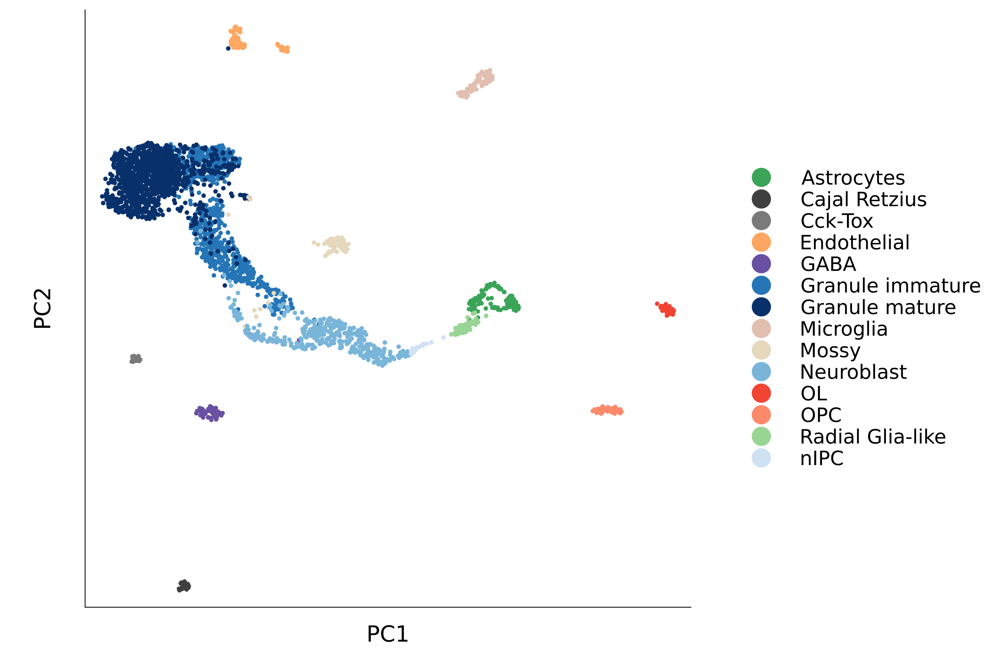

In [36]:
p = scatter(size = (1200, 800), fg_legend = :transparent, left_margin = 1.8Plots.cm, bottom_margin = 1.0Plots.cm, dpi = 300) #
for label in labels
    scatter!(embedding[celltype .== label, 1], embedding[celltype .== label, 2], label = label, color = palattes[label], legend=:outerright, legendfontsize = 16
        , xlabel = "PC1", ylabel = "PC2", xtick = nothing, yticks = nothing, xguidefontsize = 18, yguidefontsize = 18)
end
p

In [37]:
savefig(p, "figure/dentategyrus_kinetic_embedding.png")

"/media/data/bmi111/KuanChiun/JuloVelo/thesis/results/dentategyrus/full/figure/dentategyrus_kinetic_embedding.png"